Romain Goldenberg / Flowminder foundation  
<img src="img/f_blue@2x.png" width="15%" align="left"/>

# Practical 2: CDR analytics
---
---
This exercise provides an example of data analysis using CDR (Call detail Records) data.

**The problem:** You are provided with a raw dataset, which contains a subset of a larger CDR data records. We want to understand the dataset available and perform a first mobility analysis. We will first need to explore, clean and/or re-structure the dataset. Then, when we have a good understanding of the data, produce a first mobility indicator.

## Important reminder
---

For the purpose of this exercise, we will be working with synthetic CDR data (i.e. produced by a model, not by real mobile phone communications) and cell towers.  
However, keep in mind that:
1. (real) CDR data are **sensitive, personal data and must have strong protections to preserve the privacy of individuals**.
2. the locations of (real) cell towers may be **commercially sensitive or have national security implications**.

A real dataset would thus **NEVER be openly shared, nor should it be directly accessible**.

If you want to learn more about the ways we work with sensitive data, [you can find more information here](https://www.flowgeek.org/data-governance).  
And if you want to learn more about CDR data in general,  [you can find more information here](https://www.flowgeek.org/).

## 1. Getting started
---
### 1.1. Exercise Overview
---
Using data & geospatial analysis in Python, this demo will show an assessment of mobility patterns in Nigeria using a synthetic CDR dataset from the country.

In this exercise we are going to:

- Load some spatial data & CDR data
- Explore the dataset
- Aggregate and transform the dataset
- Try and identify some initial trends of mobility

### 1.2. Loading Packages
---

In [1]:
import os

import folium
import geopandas as gpd
import matplotlib.colors as mcolors
import numpy as np
import pandas as pd
from IPython.display import display
from matplotlib import pyplot as plt
from matplotlib.colors import TwoSlopeNorm

### 1.3. Mapping function
---

In [2]:
def create_interactive_map(layers):
    def explore_layer(layer_dict, m=None):
        """Helper function to generate a layer for the map."""
        data = layer_dict["data"]
        layer_color = layer_dict.get("color", "black")
        activate_tooltip = layer_dict.get("activate_tooltip", True)
        tooltip = None if not activate_tooltip else layer_dict.get("tooltip", None)
        popup = layer_dict.get("popup", None)

        return data.explore(
            m=m,
            color=layer_color,
            style_kwds=dict(
                fillColor=layer_color,
                fill=True,
                opacity=1.0,
                fillOpacity=0.0,
                interactive=True,
            ),
            tooltip=tooltip,
            popup=popup,
            tooltip_kwds={"labels": activate_tooltip} if activate_tooltip else {},
            popup_kwds={},
            highlight=activate_tooltip,
            smooth_factor=2,
            name=layer_dict["name"],
        )

    # Create initial layer
    created_map = explore_layer(layers[0])

    # Add subsequent layers
    for layer_dict in layers[1:]:
        explore_layer(layer_dict, m=created_map)

    # Add layer control to the map
    folium.LayerControl().add_to(created_map)

    return created_map

### 1.4. Loading Datasets
---

In [3]:
# Path for the data folder
data_path = os.path.join(os.getcwd(), "Data/Practical_2")

# We open the CDR data with pandas:
NGA_CDR = pd.read_csv(data_path + "/NGA_synthetic_CDR.csv")

# We open the different shapefiles datasets with geopandas:
NGA_admin1 = gpd.read_file(data_path + "/NGA_admin1.geojson")
NGA_admin2 = gpd.read_file(data_path + "/NGA_admin2.geojson")
NGA_cell_towers = gpd.read_file(data_path + "/NGA_cell_towers.geojson")

We will be using four datasets in this example.

>1. Synthetic CDR data for Nigeria
>2. Cell towers in the country
>3. States boundary
>4. Wards boundaries

## 2. Quick informations on the data
---

Before getting started with a project, and when doable, it is always a good idea to first explore the dataset to understand its content.

### 2.1. Mapping the dataset
---

In [4]:
to_map = [
    {
        "name": "Regions",
        "popup": "admin1name",
        "data": NGA_admin1,
        "color": "black",
        "activate_tooltip": False,
    },
    {
        "name": "Districts",
        "tooltip": "admin2name",
        "popup": "admin2name",
        "data": NGA_admin2,
        "color": "black",
    },
    {
        "name": "Cell towers",
        "tooltip": "id",
        "popup": "id",
        "data": NGA_cell_towers,
        "color": "red",
    },
]
map_admins = create_interactive_map(to_map)
map_admins

For the purpose of the exercise here, we produce a "fancy" map, but keep in mind that you can always simply call the `plot` method on a `GeoDataFrame` object to produce a "quick and dirty" map

In [5]:
type(NGA_admin2)

geopandas.geodataframe.GeoDataFrame

In [6]:
NGA_admin2.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<Axes: >

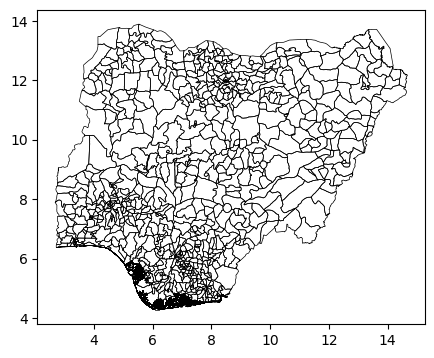

In [7]:
fig, ax = plt.subplots(figsize=(5, 5))
NGA_admin2.plot(edgecolor="black", linewidth=0.5, facecolor="none", ax=ax)

### 2.2. Data structure and content
---

We can first have a quick look at some of the content of our data

***Regions:***

In [8]:
NGA_admin1.head(3)

,admin1name,geometry
0,Abia,"MULTIPOLYGON (((7.48998 4.85506, 7.49438 4.847..."
1,Adamawa,"MULTIPOLYGON (((12.01237 7.50763, 12.00726 7.5..."
2,Akwa Ibom,"MULTIPOLYGON (((7.55570 4.50408, 7.55597 4.504..."


In [9]:
NGA_admin1.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   admin1name  37 non-null     object  
 1   geometry    37 non-null     geometry
dtypes: geometry(1), object(1)
memory usage: 724.0+ bytes


***Districts:***

In [10]:
NGA_admin2.head(3)

,admin2name,geometry
0,Aba North,"MULTIPOLYGON (((7.37961 5.05966, 7.37811 5.056..."
1,Aba South,"MULTIPOLYGON (((7.37811 5.05695, 7.37760 5.056..."
2,Arochukw,"MULTIPOLYGON (((7.89715 5.36502, 7.89458 5.369..."


In [11]:
NGA_admin2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 775 entries, 0 to 774
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   admin2name  775 non-null    object  
 1   geometry    775 non-null    geometry
dtypes: geometry(1), object(1)
memory usage: 12.2+ KB


***Cell towers:***

In [12]:
NGA_cell_towers.head(3)

,id,geometry
0,0c1e4e68d8130749009331fecb32a95b,POINT (7.38571 5.08563)
1,3a0b91b64325bd40bb65b8143ba4a3f7,POINT (7.35797 5.05780)
2,28c44ce845b41b194b9d8600bb86340a,POINT (7.31787 5.05244)


In [13]:
NGA_cell_towers.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 993 entries, 0 to 992
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   id        993 non-null    object  
 1   geometry  993 non-null    geometry
dtypes: geometry(1), object(1)
memory usage: 15.6+ KB


***CDR data:***

In [14]:
NGA_CDR.head(3)

,cdr_id,call_date,duration,msisdn,msisdn_counterpart,location_id
0,e664fc84-8e2b-432a-be48-c498ce8dfb2d,2016-01-01 17:51:11.294010+00:00,1537,ad52ccb857dcde950f1191a8c5962255,51d968f04b1c6d54308e0d8f954205b7,cf46ae8351b1c170eb6ac2f10911c160
1,48dd6d74-9ebf-4074-81fa-e872de05505d,2016-01-01 00:20:08.745089+00:00,772,ad52ccb857dcde950f1191a8c5962255,fbf9f190f490f97e799d8d1cd4331e42,cf46ae8351b1c170eb6ac2f10911c160
2,aa775c44-49ae-4b39-b563-5e5e15328d76,2016-01-02 07:36:30.522149+00:00,601,ad52ccb857dcde950f1191a8c5962255,fbf9f190f490f97e799d8d1cd4331e42,cf46ae8351b1c170eb6ac2f10911c160


In [15]:
NGA_CDR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149779 entries, 0 to 149778
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   cdr_id              149779 non-null  object
 1   call_date           149779 non-null  object
 2   duration            149779 non-null  int64 
 3   msisdn              149779 non-null  object
 4   msisdn_counterpart  149779 non-null  object
 5   location_id         149779 non-null  object
dtypes: int64(1), object(5)
memory usage: 6.9+ MB


## 3. Data exploration
---

First, we will convert the dates of `NGA_CDR` to a pandas datetime object & create a column `day` which only contains the days.

In [16]:
# Convert the column called 'call_date' to the data format datetime
NGA_CDR.call_date = pd.to_datetime(NGA_CDR.call_date)

# Add a date column (for convenience)
NGA_CDR["day"] = pd.to_datetime(NGA_CDR["call_date"].dt.date)

### 3.1. From the cell towers dataset, what is the number of cell towers?
---

Here, we are interested in the number of unique cell towers

In [17]:
NGA_cell_towers.id.nunique()

993

### 3.2.1. From the cdr dataset, what is the number of recorded events?
---

We have different strategies here.  
We can look at the count of `cdr_id` (which should be unique!)

In [18]:
NGA_CDR.cdr_id.count()

149779

And verify that those are actually unique

In [19]:
NGA_CDR.cdr_id.nunique()

149779

Or drop any duplicate rows (i.e. all attributes are the same between two rows), and look at the number of rows remaining

In [20]:
NGA_CDR.drop_duplicates().shape[0]

149779

### 3.2.2. From the cdr dataset, what time period does the dataset cover (i.e. start date and end date)?
---

First, we select the first and last day from our dataset, and substract them

In [21]:
min_d = NGA_CDR.day.min()
max_d = NGA_CDR.day.max()
days_count = (max_d - min_d).days + 1

We can then display the results

In [22]:
print(
    f'From {min_d.strftime("%Y-%m-%d")} to {max_d.strftime("%Y-%m-%d")}, {days_count} days.'
)

From 2016-01-01 to 2016-02-29, 60 days.


### 3.2.3. From the cdr dataset, how many (unique) subscribers are in this dataset?
---

In [23]:
subscriber_count = NGA_CDR.msisdn.nunique()
subscriber_count

4970

#### Can we then estimate the average number of events per subscribers, per day?
---

We calculate the total number of (unique) events, the time period, and reuse the total number of (unique) subscribers

In [24]:
event_count = NGA_CDR.cdr_id.nunique()
days_count = (max_d - min_d).days + 1

In [25]:
avg = (event_count / subscriber_count) / days_count
print(f"Approximately {round(avg,2)} events, per subscriber per day.")

Approximately 0.5 events, per subscriber per day.


### 3.3. From the cdr dataset, what is the count of (unique) events for each subscriber?
---

In [26]:
dist = NGA_CDR.groupby(["msisdn"])["cdr_id"].nunique()
dist

msisdn
0026a4e79338e1512e4eeca7d6e13425    20
005ceb36b28c0cd11616bb795c3e7ea0    19
00626fc5ea4d3c615b3bebf03eecf35a    20
007cd678a05d7e4ce38e77c96a6ca447    43
0080b91f5c0e030d179aac45ad0fe1d4    39
                                    ..
ff8034d35431f4d397cd35cb5a4dfbd2    44
ffa9600fde4a95043b644f519c4cd419    35
ffd522a5c289faec7e2f52901e447a0a    11
ffdc10119a6b9f46f995cdb08fe834dd    25
ffe6e351fc312596ee8c957a1da7d47a    21
Name: cdr_id, Length: 4970, dtype: int64

#### Can we plot an histogram of the resulting data to see its distribution?
---

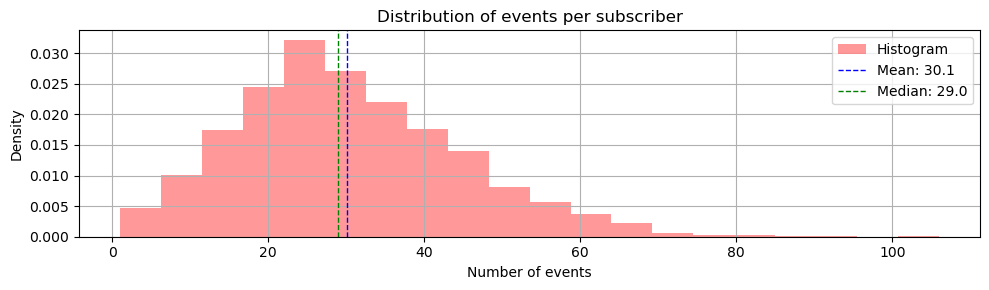

In [27]:
fig, ax = plt.subplots(figsize=(10, 3))

# Plotting the histogram
dist.hist(color="red", bins=20, density=True, ax=ax, alpha=0.4, label="Histogram")

# Displaying the mean and median
mean = dist.mean()
median = dist.median()
ax.axvline(
    mean, color="blue", linestyle="dashed", linewidth=1, label=f"Mean: {mean:.1f}"
)
ax.axvline(
    median,
    color="green",
    linestyle="dashed",
    linewidth=1,
    label=f"Median: {median:.1f}",
)

# Adding labels, title, legend
ax.set_title("Distribution of events per subscriber")
ax.set_xlabel("Number of events")
ax.set_ylabel("Density")
ax.legend()

plt.tight_layout()
plt.show()

### 3.4. From the cdr dataset, what is the count of days with phone events for each subscriber?
---

In other word, we want to count each day which has at least one event, for each individual subscriber

In [28]:
dist = NGA_CDR.groupby(["msisdn"])["day"].nunique()
dist

msisdn
0026a4e79338e1512e4eeca7d6e13425    18
005ceb36b28c0cd11616bb795c3e7ea0    17
00626fc5ea4d3c615b3bebf03eecf35a    17
007cd678a05d7e4ce38e77c96a6ca447    31
0080b91f5c0e030d179aac45ad0fe1d4    27
                                    ..
ff8034d35431f4d397cd35cb5a4dfbd2    31
ffa9600fde4a95043b644f519c4cd419    27
ffd522a5c289faec7e2f52901e447a0a    11
ffdc10119a6b9f46f995cdb08fe834dd    21
ffe6e351fc312596ee8c957a1da7d47a    14
Name: day, Length: 4970, dtype: int64

#### Can we plot an histogram of the resulting data to see its distribution?
---

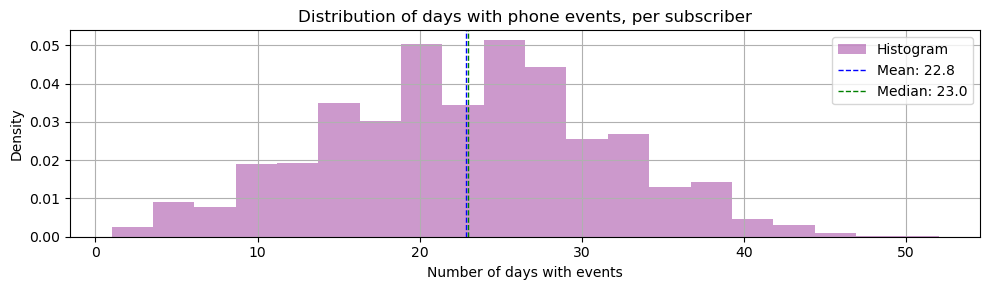

In [29]:
fig, ax = plt.subplots(figsize=(10, 3))

# Plotting the histogram
dist.hist(color="purple", bins=20, density=True, ax=ax, alpha=0.4, label="Histogram")

# Displaying the mean and median
mean = dist.mean()
median = dist.median()
ax.axvline(
    mean, color="blue", linestyle="dashed", linewidth=1, label=f"Mean: {mean:.1f}"
)
ax.axvline(
    median,
    color="green",
    linestyle="dashed",
    linewidth=1,
    label=f"Median: {median:.1f}",
)

# Adding labels, title, legend
ax.set_title("Distribution of days with phone events, per subscriber")
ax.set_xlabel("Number of days with events")
ax.set_ylabel("Density")
ax.legend()

plt.tight_layout()
plt.show()

### 3.5. How many "very active" subscribers are present in our dataset?
---

If we define a "very active" subscriber as a subscriber which is active for more than half the days of our period:

In [30]:
half_period = days_count // 2
half_period

30

If we simply want to know the count of "active subscribers"

In [31]:
# We first count the number of days with events for each subscriber
unique_days_per_msisdn = NGA_CDR.groupby("msisdn")["day"].nunique()

# Then, we only keep the subscribers with a number of days >= half_period
unique_msisdn_count = unique_days_per_msisdn[
    unique_days_per_msisdn >= half_period
].count()

unique_msisdn_count

1125

#### Can we then estimate the average number of events per active subscribers, per day?
---

We can select all the CDR data from the active subscribers

In [32]:
new_cdr = (
    NGA_CDR.groupby("msisdn")
    .filter(lambda r: r.day.nunique() >= half_period)
    .reset_index()
)

In [33]:
new_subscriber_count = new_cdr.msisdn.nunique()
new_subscriber_count

1125

In [34]:
new_event_count = new_cdr.cdr_id.nunique()
new_event_count

55946

In [35]:
new_avg = new_event_count / (new_subscriber_count * days_count)
print(f"Approximately {round(new_avg,2)} events, per active subscriber per day.")

Approximately 0.83 events, per active subscriber per day.


### Now let use locate our cell towers (with a spatial join on the regions)
---

In [36]:
# sjoin the regions information to the cell towers
cell_towers_to_regions = gpd.sjoin(
    NGA_cell_towers, NGA_admin1[["admin1name", "geometry"]]
)

# Drop the "index_right" column
cell_towers_to_regions = cell_towers_to_regions.drop(
    columns=["index_right", "geometry"]
)

cell_towers_to_regions

,id,admin1name
0,0c1e4e68d8130749009331fecb32a95b,Abia
1,3a0b91b64325bd40bb65b8143ba4a3f7,Abia
2,28c44ce845b41b194b9d8600bb86340a,Abia
3,6f9cef27a77ca6f7162dafa4876e81ea,Abia
4,2b6829f555ca4fa78b36d8882cb55d87,Abia
...,...,...
988,8407d2347bca566ba9cacf07526ffa30,Zamfara
989,5424f660b165c5ec99cffbb482d9a257,Zamfara
990,bbd9ee2c7050a51a24e987efbd387a97,Zamfara
991,6dbe532799659d1469eb839a020faff9,Zamfara


### 3.6. How many cell towers do we have per region?
---

In [37]:
# Cell tower count
cell_towers_to_regions.groupby(["admin1name"])["id"].nunique().sort_values(
    ascending=False
)

admin1name
Kano                         73
Lagos                        62
Kaduna                       41
Katsina                      40
Oyo                          39
Delta                        36
Federal Capital Territory    35
Rivers                       34
Benue                        30
Akwa Ibom                    29
Jigawa                       29
Ogun                         29
Bauchi                       28
Imo                          28
Niger                        27
Sokoto                       27
Yobe                         27
Kebbi                        26
Borno                        25
Osun                         25
Kogi                         23
Ondo                         23
Enugu                        23
Plateau                      22
Adamawa                      22
Edo                          21
Anambra                      20
Abia                         19
Gombe                        19
Zamfara                      19
Cross River                  

## 4. Constructing a CDR indicator
---

How do we combine the different parts of our dataset to achieve our objectives?

<center>
    <img src="img/data_joins.png" width="75%"/>
</center>

To explore this dataset, we will produce a simple mobility indicator: the change in daily subscribers' presence.  
For this purpose we will need to compute an aggregate of the subscribers' counts per locality (at the region level in our case).

### 4.1. First we locate our CDR data
---

To locate our CDR data, we can use the `cell_towers_to_regions` pandas table created previously

In [38]:
cell_towers_to_regions.head(2)

,id,admin1name
0,0c1e4e68d8130749009331fecb32a95b,Abia
1,3a0b91b64325bd40bb65b8143ba4a3f7,Abia


We can then join this table with our CDR data, and only keep the data important for the rest of this exercise

In [39]:
# Merge the cell tower information (and the region information, since it is already attached to the cell towers)
NGA_CDR_located = NGA_CDR.merge(
    cell_towers_to_regions, left_on="location_id", right_on="id"
)

# We then clean-up our table
NGA_CDR_located = NGA_CDR_located[
    ["day", "msisdn", "location_id", "id", "admin1name"]
].sort_values(by="day")
NGA_CDR_located.head(2)

,day,msisdn,location_id,id,admin1name
0,2016-01-01,ad52ccb857dcde950f1191a8c5962255,cf46ae8351b1c170eb6ac2f10911c160,cf46ae8351b1c170eb6ac2f10911c160,Katsina
24820,2016-01-01,e8e3257cb5bbdb465a26791e7074cc0c,4081315b621aacd51e78e05f61743978,4081315b621aacd51e78e05f61743978,Ebonyi


In [40]:
# Final clean-up
NGA_CDR_located = NGA_CDR_located[["day", "msisdn", "admin1name"]].reset_index(
    drop=True
)
NGA_CDR_located

,day,msisdn,admin1name
0,2016-01-01,ad52ccb857dcde950f1191a8c5962255,Katsina
1,2016-01-01,e8e3257cb5bbdb465a26791e7074cc0c,Ebonyi
2,2016-01-01,e8e3257cb5bbdb465a26791e7074cc0c,Ebonyi
3,2016-01-01,e8e3257cb5bbdb465a26791e7074cc0c,Ebonyi
4,2016-01-01,22853dba12650baabb02b77318b751f6,Anambra
...,...,...,...
149774,2016-02-29,024f6878e538f8879e9a4f0256c72b79,Benue
149775,2016-02-29,25dbfdaed084d906edc9adb333da3614,Benue
149776,2016-02-29,8e459f20b066be18af2884a551fae4db,Benue
149777,2016-02-29,21fcee92762cb59e38b135104a46a491,Ogun


### 4.2. Using `NGA_CDR_located`, compute the total (unique) subscribers count per day, per locality for the entire time period
---

In other words, we want to have one value per day and region, which is the total number of subscribers active in this region, on this day. This first result is called a [mobility aggregate](https://www.flowgeek.org/methods/calculating-mobility-aggregates), which groups the pseudonymised CDR data of many individual subscribers into an output that characterises the behaviour of the entire group of subscribers.  
We only keep resulting values for subscribers counts ≥ 15, to protect the privacy of individual subscribers.

In [41]:
count_subscribers_per_region = NGA_CDR_located.groupby(["day", "admin1name"])[
    "msisdn"
].nunique()

count_subscribers_per_region = count_subscribers_per_region[
    count_subscribers_per_region >= 15
]
count_subscribers_per_region

day         admin1name
2016-01-01  Abia          32
            Adamawa       44
            Akwa Ibom     48
            Anambra       42
            Bauchi        47
                          ..
2016-02-29  Rivers        74
            Sokoto        45
            Taraba        21
            Yobe          44
            Zamfara       48
Name: msisdn, Length: 2185, dtype: int64

#### Calculate the sum of subscribers per day, using the previous `count_subscribers_per_region`
---

Does it correspond to the total subscribers per day values calculated from the orginal CDR data?  
If not, can we explain why we observe this difference?  

Total subscribers per day using the counts per region:

In [42]:
sum_subscribers = count_subscribers_per_region.unstack().sum(axis=1, skipna=True)
sum_subscribers.head(5)

day
2016-01-01    1918.0
2016-01-02    1933.0
2016-01-03    1944.0
2016-01-04    1915.0
2016-01-05    1967.0
dtype: float64

Total subscribers per day using the original CDR data:

In [43]:
NGA_CDR_located.groupby("day")["msisdn"].nunique().head(5)

day
2016-01-01    1864
2016-01-02    1895
2016-01-03    1907
2016-01-04    1889
2016-01-05    1938
Name: msisdn, dtype: int64

Any aggregate that counts the number of unique subscribers that have e.g. visited a certain locality is not 'additive', in the sense that aggregates calculated for the smallest locality size or time interval cannot be summed to compute the value for a larger locality size or time interval.  
For example, Locality A may be composed of smaller subdivisions a1, a2, and a3. We can count the number of unique subscribers that visited a1, a2, and a3. But because some subscribers may have visited both a1 and a2, we cannot simply sum the number of subscribers that visited each subdivision to obtain the number of unique subscribers that visited Locality A (because subscribers will be counted multiple times if they visited multiple subdivisions). A similar reasoning applies to time intervals.

### 4.3. First aggregate plot
---

Let us first do a naive, simple first plot of our aggregate

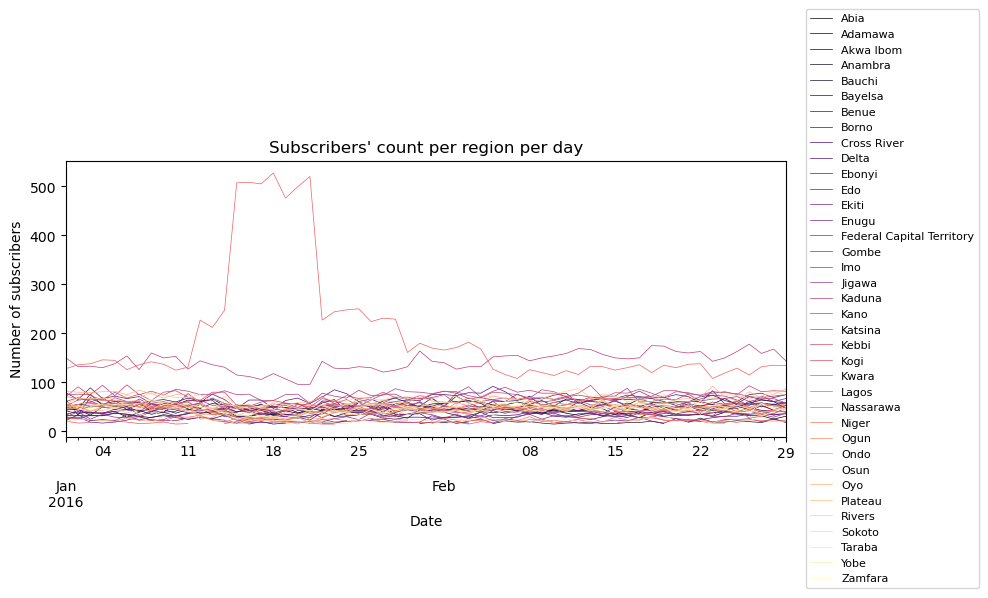

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
count_subscribers_per_region.unstack().plot(
    linewidth=0.5,
    ax=ax,
    cmap="magma",
)

# Adjust the font size in the legend
ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5), prop={"size": 8})

# Adding labels, title, legend
ax.set_title("Subscribers' count per region per day")
ax.set_xlabel("Date")
ax.set_ylabel("Number of subscribers")

plt.tight_layout()
plt.show()

And calculate the average number of subscribers per region over the period

In [45]:
count_subscribers_per_region.unstack().mean().astype(int).sort_values(
    ascending=False
).head(5)

admin1name
Lagos      195
Kano       142
Kaduna      76
Katsina     73
Delta       68
dtype: int32

**What is happening on the 12th of January 2016?**

### 4.4. Produce the CDR indicator
---

We now are in a situation where we can produce our first mobility indicator.  
We need to make sure it is accurate, but also that it does not compromise any sensitive information.

#### 4.4.1. Create a baseline period
---

We will now produce a baseline (i.e. reference period for mobility) based on the (assumed) date of the event which provoked changes in mobility. Since we are dealing with a small CDR dataset, we will produce a baseline from 11 days of data (please keep in mind that it is recommended to use a larger reference period to produce a baseline from a full CDR dataset, e.g. a month of data).

From the aggregate, we extract the data leading to the date we observed changes (this date not included), and calculate the median count of subscribers over this period for each region. We thereafter refer to this result as the baseline period.

We reshape our dataset

In [46]:
count_subscribers_per_region = count_subscribers_per_region.reset_index("admin1name")
count_subscribers_per_region.head(3)

,admin1name,msisdn
day,,
2016-01-01,Abia,32
2016-01-01,Adamawa,44
2016-01-01,Akwa Ibom,48


Select the time period

In [47]:
baseline = count_subscribers_per_region["2016-01-01":"2016-01-11"]
baseline

,admin1name,msisdn
day,,
2016-01-01,Abia,32
2016-01-01,Adamawa,44
2016-01-01,Akwa Ibom,48
2016-01-01,Anambra,42
2016-01-01,Bauchi,47
...,...,...
2016-01-11,Rivers,69
2016-01-11,Sokoto,49
2016-01-11,Taraba,27


And calculate a median value of subscriber counts over this period, for each region

In [48]:
baseline = baseline.groupby(["admin1name"])["msisdn"].median()
baseline = baseline.rename("baseline")
baseline.sort_values(ascending=False).head(5)

admin1name
Kano       138.0
Lagos      136.0
Oyo         79.0
Kaduna      76.0
Katsina     73.0
Name: baseline, dtype: float64

#### 4.4.2. Divide each daily value by the baseline period value (and convert to percentages)
---

We first merge our baseline with our daily counts

In [49]:
indicator = pd.merge(
    count_subscribers_per_region.reset_index(), baseline, on="admin1name", how="left"
)
indicator = indicator.set_index("day")
indicator.head(3)

,admin1name,msisdn,baseline
day,,,
2016-01-01,Abia,32,32.0
2016-01-01,Adamawa,44,45.0
2016-01-01,Akwa Ibom,48,53.0


And convert our daily values to proportions of the baseline period (i.e. changes compared to a normal period of mobility)

In [50]:
indicator["proportion"] = (indicator.msisdn / indicator.baseline - 1) * 100
indicator.head(3)

,admin1name,msisdn,baseline,proportion
day,,,,
2016-01-01,Abia,32,32.0,0.000000
2016-01-01,Adamawa,44,45.0,-2.222222
2016-01-01,Akwa Ibom,48,53.0,-9.433962


### 4.5. Indicator plots
---

We can now plot our indicator, the daily subscribers proportions for each region.

We first slightly transform our data

In [51]:
indicator_to_plot = indicator.pivot(columns="admin1name", values="proportion")
indicator_to_plot.head(3)

admin1name,Abia,Adamawa,Akwa Ibom,Anambra,Bauchi,Bayelsa,Benue,Borno,Cross River,Delta,...,Ogun,Ondo,Osun,Oyo,Plateau,Rivers,Sokoto,Taraba,Yobe,Zamfara
day,,,,,,,,,,,,,,,,,,,,,
2016-01-01,0.0,-2.222222,-9.433962,7.692308,-11.320755,3.030303,6.557377,16.666667,-12.0,17.910448,...,14.516129,-10.0,9.803922,3.797468,6.666667,-18.840580,0.000000,-20.0,3.636364,-15.909091
2016-01-02,0.0,0.000000,3.773585,-5.128205,-13.207547,NaN,-45.901639,-14.583333,36.0,-2.985075,...,8.064516,10.0,0.000000,1.265823,2.222222,-1.449275,-1.923077,0.0,10.909091,0.000000
2016-01-03,0.0,-26.666667,0.000000,0.000000,43.396226,NaN,13.114754,8.333333,-12.0,32.835821,...,6.451613,-18.0,-3.921569,0.000000,-6.666667,-2.898551,0.000000,0.0,-3.636364,6.818182


And create our plots

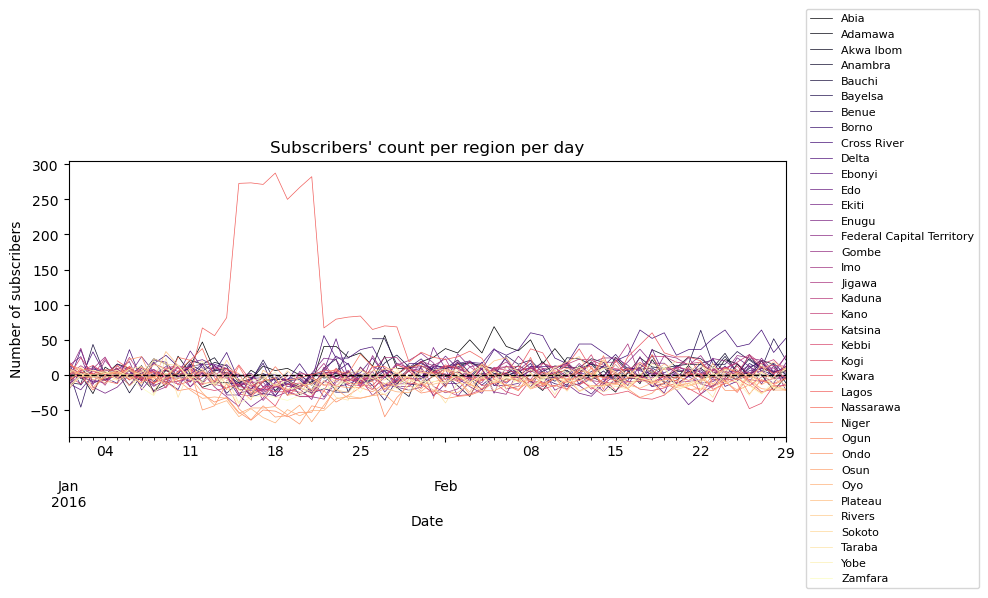

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))

indicator_to_plot.plot(linewidth=0.5, ax=ax, cmap="magma")

ax.axhline(
    0,
    color="black",
    linestyle="dashed",
    linewidth=1,
)

# Adjust the font size in the legend
ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5), prop={"size": 8})

# Adding labels, title, legend
ax.set_title("Subscribers' count per region per day")
ax.set_xlabel("Date")
ax.set_ylabel("Presence compared to baseline period [%]")

plt.tight_layout()
plt.show()

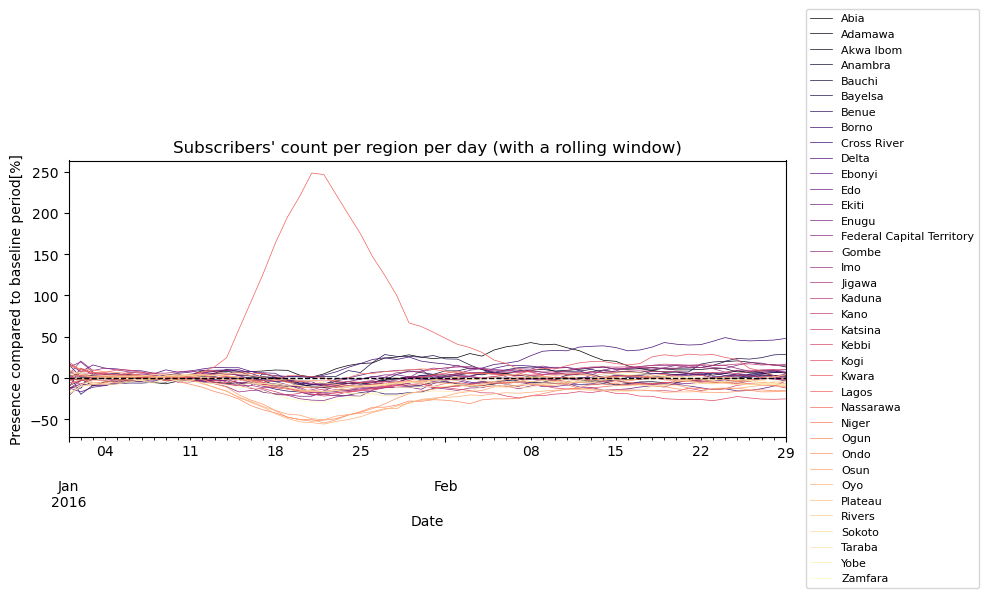

In [56]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))

indicator_to_plot.rolling(7, closed="both", min_periods=1).mean().plot(
    linewidth=0.5, ax=ax, cmap="magma"
)
ax.axhline(
    0,
    color="black",
    linestyle="dashed",
    linewidth=1,
)

# Adjust the font size in the legend
ax.legend(loc="center left", bbox_to_anchor=(1.02, 0.5), prop={"size": 8})

# Adding labels, title, legend
ax.set_title("Subscribers' count per region per day (with a rolling window)")
ax.set_xlabel("Date")
ax.set_ylabel("Presence compared to baseline period [%]")

plt.tight_layout()
plt.show()

#### Mapping some results from our indicator
---
Below, we map the values for the 18th of January.

In [54]:
map_18 = indicator[["admin1name", "proportion"]].loc["2016-01-18"]
map_18 = pd.merge(NGA_admin1, map_18, on="admin1name", how="left")
map_18.head(3)

,admin1name,geometry,proportion
0,Abia,"MULTIPOLYGON (((7.48998 4.85506, 7.49438 4.847...",6.250000
1,Adamawa,"MULTIPOLYGON (((12.01237 7.50763, 12.00726 7.5...",-22.222222
2,Akwa Ibom,"MULTIPOLYGON (((7.55570 4.50408, 7.55597 4.504...",-5.660377


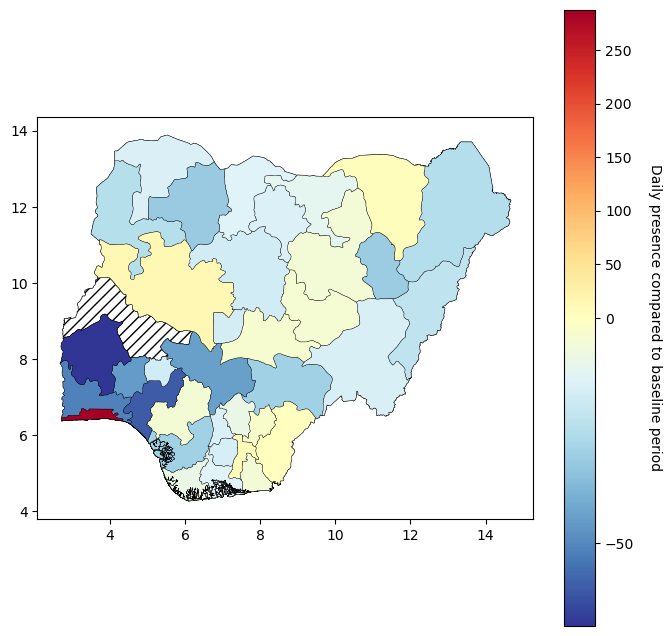

In [55]:
# Define vmin, vcenter, and vmax
vmin_value = map_18["proportion"].min()
vcenter_value = 0
vmax_value = map_18["proportion"].max()

# Create the norm object
norm = TwoSlopeNorm(vmin=vmin_value, vcenter=vcenter_value, vmax=vmax_value)

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
NGA_admin1.plot(edgecolor="black", hatch="///", linewidth=0.5, facecolor="none", ax=ax)

# Plot with the specified norm
cax = map_18.plot(
    column="proportion",
    edgecolor="black",
    linewidth=0.25,
    legend=True,
    cmap="RdYlBu_r",
    ax=ax,
    norm=norm,
)

# Add title to the colorbar
colorbar = ax.get_figure().get_axes()[-1]  # The last axis object is the colorbar
colorbar.set_ylabel(
    "Daily presence compared to baseline period [%]", rotation=270, labelpad=20
)

plt.show()

**How would you explain the trends you observe from these results?  
If you had to take a guess, which kind of event could explain this type of mobility?**